### Signal Processing

In [2]:
using Plots
using DSP
using Wavelets
using FFTW
using LinearAlgebra
using FileIO: load, save
import LibSndFile

### Sound Data

In [46]:
# audio signal
w=load("cheese.wav");
fs=w.samplerate
x=w.data[:, 1];
t = (0 : length(x)-1) / w.samplerate;
T=length(w)/fs;
X=[t x];

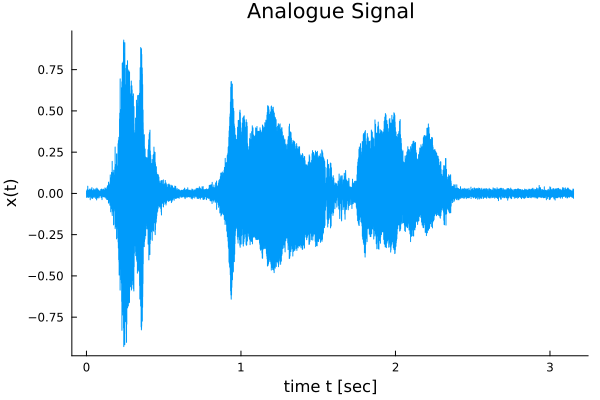

In [37]:
# analogue signal 
p1=plot(t,x,
    xaxis="time t [sec]", 
    yaxis="x(t)", 
    title="Analogue Signal", 
    grid=false, 
    legend=false)
savefig("cheese_analogue_signal.png")
# discrete time signal
p2=plot(x, 
    xaxis="n=0,1,2,3....", 
    yaxis="x[n]", 
    title="Discrete Time Signal", 
    grid=false, 
    legend=false)

plot(p1,size=(600,400))

### Discrete Fourier Transform

In [38]:
hats=fft(x);
k = (0:length(hats)-1)*50/length(hats);
G=broadcast(abs, hats);

In [48]:
N=length(x)

69520

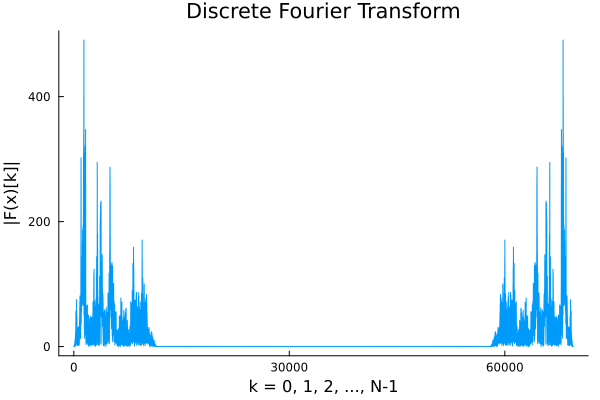

In [49]:
plot(G,
    xaxis="k = 0, 1, 2, ..., N-1", 
    yaxis="|F(x)[k]|", 
    title="Discrete Fourier Transform", 
    grid=false, 
    legend=false)
plot!(xticks = ([0 30000 60000;], [0,30000,60000]))
plot!(yticks = ([0 200 400;], [0,200,400]))

### Sampled Discrete Fourier Transform

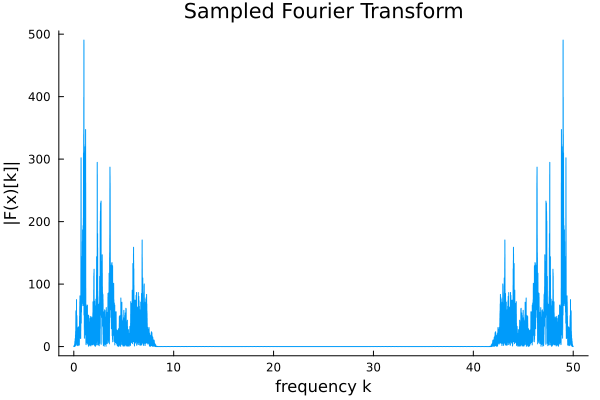

In [41]:
plot(k,G,
    xaxis="frequency k", 
    yaxis="|F(x)[k]|", 
    title="Sampled Fourier Transform", 
    grid=false, 
    legend=false)

### Shifted Discrete Fourier Transform
$$\hat{f}(\xi)=\int_{-\infty}^\infty e^{-2\pi ix\xi} f(x)dx $$

In [42]:
kshift = (-length(x)/2:length(s)/2-1)*(50/length(x));
l = (-length(hats)/2:length(hats)/2-1);
Gshift = fftshift(G);

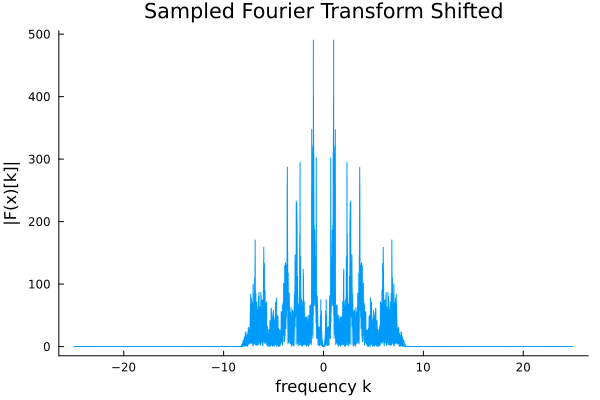

In [10]:
# sampled FFT shifted
p3=plot(kshift,Gshift,
    xaxis="frequency k", 
    yaxis="|F(x)[k]|", 
    title="Sampled Fourier Transform Shifted", 
    grid=false, 
    legend=false)
savefig("cheese_sampled_fourier_transform_shifted.png")
# FFT shifted
p4=plot(l,Gshift,
    xaxis="discrete frequency k", 
    yaxis="|F(x)[k]|", 
    title="Discrete Fourier Transform Shifted", 
    grid=false, 
    legend=false)

plot(p3)

### Spectrogram

In [43]:
# setting integers
L=256;
M1=128;
M=2*M1;
N0=250;
n0=1+floor(Int, (N-L)/(L-N0));
s=L-N0;

# window
h=hanning(L);

In [44]:
# the N-th root of unity
omega=exp(2*pi*im/M);

# sqrt(N) times the Fourier matrix
F=zeros(Complex, M, M);
for m=1:M
    for n=1:M
        F[m,n]=omega^(-(m-1)*(n-1))
    end
end

# sampling and locarization
Y=zeros(Complex, L,n0);
for l=1:L
    for j=1:n0
        Y[l,j]=h[l]*x[s*(j-1)+l]
    end
end

# discrete short-time Fourier transform
Z=F*Y;

# spectrogram
X1=zeros(Float64, M1+1,n0);
for k=1:M1+1
    for j=1:n0
        X1[k,j]=abs.(Y[M1+2-k,j])
    end
end

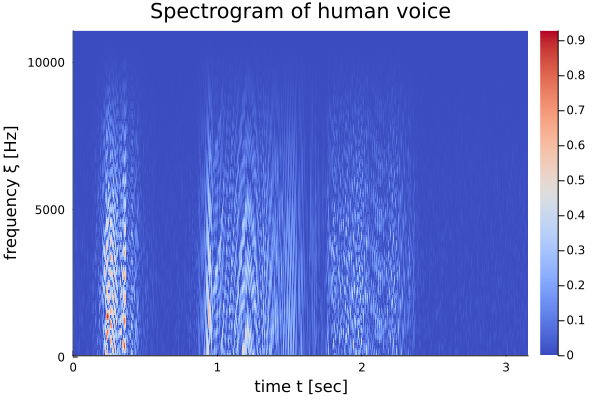

In [45]:
# plotting
p5=plot(X1, 
    title="Spectrogram of human voice", 
    st=:heatmap, 
    color=:coolwarm, 
    xaxis="n = 1, 1, 2, ..., n0-1", 
    yaxis="k = 0, 1, 2, ..., M/2")
plot!(xticks = ([0 5000 10000;], [0 5000 10000]))
plot!(yticks = ([0 50 100;], [0 50 100]))

p6=plot(X1, 
    title="Spectrogram of human voice", 
    st=:heatmap, 
    color=:coolwarm, 
    xaxis="time t [sec]", 
    yaxis="frequency ξ [Hz]")
plot!(xticks = ([0 n0/T 2*n0/T 3*n0/T;], [0, 1, 2, 3]))
plot!(yticks = ([0 129*5000/11025 129*10000/11025;], [0, 5000, 10000]))
savefig("cheese_spectrogram.png")

plot(p6)

### Wavelet Decomposition

In [20]:
y1=dwt(X[:,2], wavelet(WT.db2), 1);
y2=dwt(X[:,2], wavelet(WT.db2), 2);
y3=dwt(X[:,2], wavelet(WT.db2), 3);
y4=dwt(X[:,2], wavelet(WT.db2), 4);

y1a=zeros(N);
y2a=zeros(N);
y3a=zeros(N);
y4a=zeros(N);
y1a[1:Int(N/2)]=y1[1:Int(N/2)];
y2a[1:Int(N/4)]=y2[1:Int(N/4)];
y3a[1:Int(N/8)]=y3[1:Int(N/8)];
y4a[1:Int(N/16)]=y4[1:Int(N/16)];
y1d=y1-y1a;
y2d=y2-y2a;
y3d=y3-y3a;
y4d=y4-y4a;

x1a=idwt(y1a, wavelet(WT.haar), 1);
x1d=idwt(y1d, wavelet(WT.haar), 1);
x2a=idwt(y2a, wavelet(WT.haar), 2);
x2d=idwt(y2d, wavelet(WT.haar), 2);
x3a=idwt(y3a, wavelet(WT.haar), 3);
x3d=idwt(y3d, wavelet(WT.haar), 3);
x4a=idwt(y4a, wavelet(WT.haar), 4);
x4d=idwt(y4d, wavelet(WT.haar), 4);

In [15]:
# x1a
p1a=plot(x1a, 
    xaxis="time t [sec]", 
    yaxis="amplitude", 
    title="Level 1 Approximation", 
    grid=false, 
    legend=false)
plot!(xticks = ([0 fs 2*fs 3*fs;], [0 1 2 3]))
plot!(yticks = ([-0.8 0 0.8;], [-0.8 "0" 0.8]))
# x1d
p1d=plot(x1d, 
    xaxis="time t [sec]", 
    yaxis="amplitude", 
    title="Level 1 Detail", 
    grid=false, 
    legend=false)
plot!(xticks = ([0 fs 2*fs 3*fs;], [0 1 2 3]))
plot!(yticks = ([-0.1 0 0.1;], [-0.1 "0" 0.1]))
# x1
plot(p1a, p1d, layout = (1,2))
savefig("cheese_db2_level1_ad.png")

# x2a
p2a=plot(x2a, 
    xaxis="time t [sec]", 
    yaxis="amplitude", 
    title="Level 2 Approximation", 
    grid=false, 
    legend=false)
plot!(xticks = ([0 fs 2*fs 3*fs;], [0 1 2 3]))
plot!(yticks = ([-0.8 0 0.8;], [-0.8 "0" 0.8]))
# x2d
p2d=plot(x2d, 
    xaxis="time t [sec]", 
    yaxis="amplitude", 
    title="Level 2 Detail", 
    grid=false, 
    legend=false)
plot!(xticks = ([0 fs 2*fs 3*fs;], [0 1 2 3]))
plot!(yticks = ([-0.4 0 0.5;], [-0.4 "0" 0.5]))
# x2
plot(p2a, p2d, layout = (1,2))
savefig("cheese_db2_level2_ad.png")

# x3a
p3a=plot(x3a, 
    xaxis="time t [sec]", 
    yaxis="amplitude", 
    title="Level 3 Approximation", 
    grid=false, 
    legend=false)
plot!(xticks = ([0 fs 2*fs 3*fs;], [0 1 2 3]))
plot!(yticks = ([-1 0 1;], [-1 0 1]))
# x3d
p3d=plot(x3d, 
    xaxis="time t [sec]", 
    yaxis="amplitude", 
    title="Level 3 Detail", 
    grid=false, 
    legend=false)
plot!(xticks = ([0 fs 2*fs 3*fs;], [0 1 2 3]))
plot!(yticks = ([-1 0 1;], [-1 0 1]))
# plot!(yticks = ([-0.8 0 1;], [-0.8 "0" "1"]))
# x3
plot(p3a, p3d, layout = (1,2))
savefig("cheese_db2_level3_ad.png")

# x4a
p4a=plot(x4a, 
    xaxis="time t [sec]", 
    yaxis="amplitude", 
    title="Level 4 Approximation", 
    grid=false, 
    legend=false)
plot!(xticks = ([0 fs 2*fs 3*fs;], [0 1 2 3]))
plot!(yticks = ([-1 0 1;], [-1 0 1]))
# x4d
p4d=plot(x4d, 
    xaxis="time t [sec]", 
    yaxis="amplitude", 
    title="Level 4 Detail", 
    grid=false, 
    legend=false)
plot!(xticks = ([0 fs 2*fs 3*fs;], [0 1 2 3]))
plot!(yticks = ([-1 0 1;], [-1 0 1]))
# x4
plot(p4a, p4d, layout = (1,2))
savefig("cheese_db2_level4_ad.png")

"/home/hc/Dropbox/Julia/sound/sound_cheese/cheese_db2_level4_ad.png"

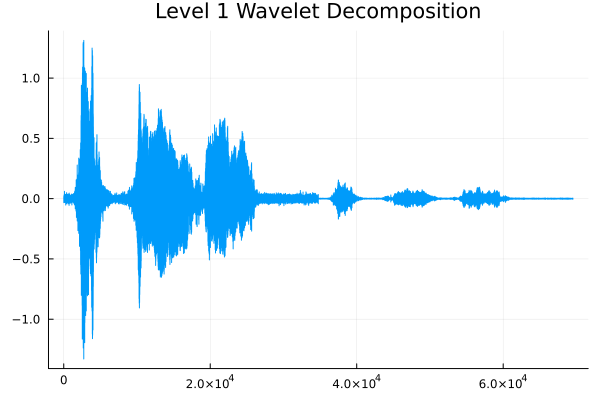

In [40]:
p7=plot(y1,title="Level 1 Wavelet Decomposition",legend=false)
savefig("cheese_db2_level.png")
plot(p7)